In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import MinMaxScaler

iris = pd.read_csv("syn_bean_merged.csv")
x = iris.iloc[:, [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]].values
iris.info()
iris[0:10]

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2500 entries, 0 to 2499
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Area             2500 non-null   float64
 1   Perimeter        2500 non-null   float64
 2   MajorAxisLength  2500 non-null   float64
 3   MinorAxisLength  2500 non-null   float64
 4   AspectRation     2500 non-null   float64
 5   Eccentricity     2500 non-null   float64
 6   ConvexArea       2500 non-null   float64
 7   EquivDiameter    2500 non-null   float64
 8   Extent           2500 non-null   float64
 9   Solidity         2500 non-null   float64
 10  roundness        2500 non-null   float64
 11  Compactness      2500 non-null   float64
 12  ShapeFactor1     2500 non-null   float64
 13  ShapeFactor2     2500 non-null   float64
 14  ShapeFactor3     2500 non-null   float64
 15  ShapeFactor4     2500 non-null   float64
 16  Class            2500 non-null   object 
dtypes: float64(16)

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,56446.0346,867.9067,301.1701,257.0556,1.2436,0.4598,62117.9936,262.1923,0.7814,0.9904,0.9778,0.8752,0.0047,0.0018,0.7690,0.9966,SEKER
1,34509.4050,695.6935,235.3013,191.9299,1.1959,0.6446,33463.1917,202.8720,0.7938,0.9881,0.9431,0.9060,0.0065,0.0028,0.8236,1.0006,SEKER
2,34922.4156,653.0488,219.8630,204.8375,1.1208,0.4304,35671.2293,209.2976,0.7810,0.9893,0.9389,0.9497,0.0067,0.0034,0.8910,0.9985,SEKER
3,33345.5467,644.0226,226.2896,184.1950,1.1857,0.5371,32655.3745,197.8041,0.7861,0.9921,0.9735,0.9052,0.0068,0.0030,0.8186,0.9987,SEKER
4,38702.8803,732.0084,249.9395,203.5803,1.2299,0.5482,39674.1787,228.9968,0.8059,0.9878,0.9240,0.8963,0.0061,0.0027,0.8376,0.9973,SEKER
5,48101.9153,698.9611,234.6274,223.3016,1.1569,0.6685,18410.2145,273.2011,0.7934,0.9976,0.9507,0.8391,0.0061,0.0015,0.7210,0.9972,SEKER
6,37722.0974,701.9370,241.0999,202.4774,1.1026,0.5113,37741.5966,224.1097,0.7744,0.9915,0.9659,0.9439,0.0063,0.0028,0.8591,0.9991,SEKER
7,26863.1165,762.3910,236.4098,220.0619,1.0636,0.4877,29013.2226,207.3683,0.7757,0.9942,0.9009,0.8958,0.0067,0.0028,0.8546,1.0014,SEKER
8,42461.4595,760.5596,255.4587,213.1333,1.2091,0.5935,45054.0142,234.9606,0.7521,0.9941,0.9595,0.8949,0.0060,0.0024,0.8105,0.9971,SEKER
9,35364.3386,659.8154,222.5376,180.7467,1.1087,0.4551,32666.8558,200.1561,0.7812,0.9899,0.9286,0.9343,0.0068,0.0033,0.8350,0.9985,SEKER


In [5]:
#Finding the optimum number of clusters for k-means classification
from sklearn.cluster import KMeans
# from sklearn.cluster import MiniBatchKMeans as KMeans

wcss = []

for i in range(1, 11):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', max_iter = 200, n_init = 10, random_state = 0)
    kmeans.fit(x)
    wcss.append(kmeans.inertia_)


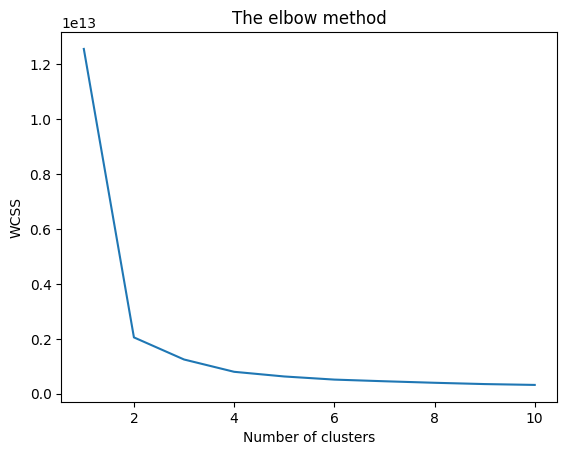

In [6]:
plt.plot(range(1, 11), wcss)
plt.title('The elbow method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS') #within cluster sum of squares
plt.show()


In [7]:
kmeans = KMeans(n_clusters = 5, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
y_kmeans = kmeans.fit_predict(x)

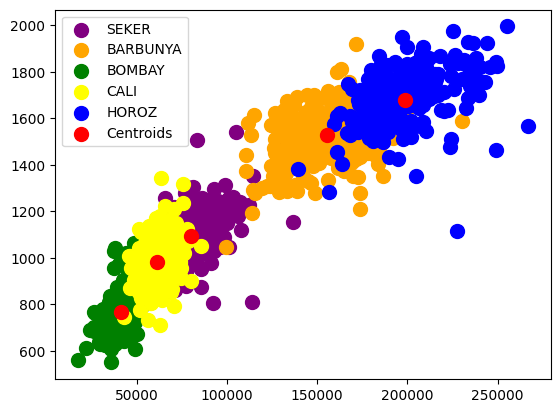

In [8]:
# iris_1=iris.loc[iris["Class"]=="SEKER"]
# iris_2=iris.loc[iris["Class"]=="BARBUNYA"]
# iris_3=iris.loc[iris["Class"]=="BOMBAY"]
# iris_4=iris.loc[iris["Class"]=="CALI"]
# iris_5=iris.loc[iris["Class"]=="HOROZ"]
#Visualising the clusters
plt.scatter(x[y_kmeans == 0, 0], x[y_kmeans == 0, 1], s = 100, c = 'purple', label = 'SEKER')
plt.scatter(x[y_kmeans == 1, 0], x[y_kmeans == 1, 1], s = 100, c = 'orange', label = 'BARBUNYA')
plt.scatter(x[y_kmeans == 2, 0], x[y_kmeans == 2, 1], s = 100, c = 'green', label = 'BOMBAY')
plt.scatter(x[y_kmeans == 3, 0], x[y_kmeans == 3, 1], s = 100, c = 'yellow', label = 'CALI')
plt.scatter(x[y_kmeans == 4, 0], x[y_kmeans == 4, 1], s = 100, c = 'blue', label = 'HOROZ')

#Plotting the centroids of the clusters
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:,1], s = 100, c = 'red', label = 'Centroids')

plt.legend()

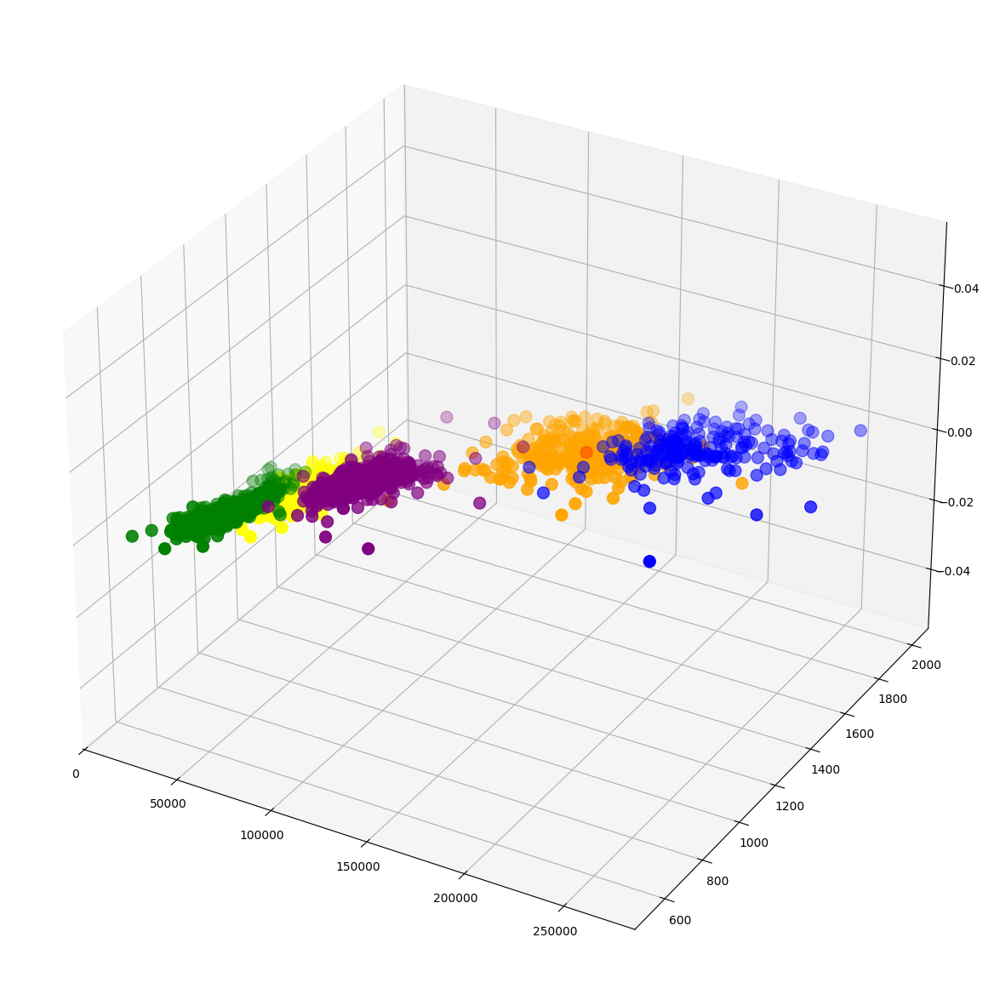

In [9]:
# 3d scatterplot using matplotlib

fig = plt.figure(figsize = (15,15))
ax = fig.add_subplot(111, projection='3d')

plt.scatter(x[y_kmeans == 0, 0], x[y_kmeans == 0, 1], s = 100, c = 'purple', label = 'SEKER')
plt.scatter(x[y_kmeans == 1, 0], x[y_kmeans == 1, 1], s = 100, c = 'orange', label = 'BARBUNYA')
plt.scatter(x[y_kmeans == 2, 0], x[y_kmeans == 2, 1], s = 100, c = 'green', label = 'BOMBAY')
plt.scatter(x[y_kmeans == 3, 0], x[y_kmeans == 3, 1], s = 100, c = 'yellow', label = 'CALI')
plt.scatter(x[y_kmeans == 4, 0], x[y_kmeans == 4, 1], s = 100, c = 'blue', label = 'HOROZ')

#Plotting the centroids of the clusters
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:,1], s = 100, c = 'red', label = 'Centroids')
plt.show()

In [10]:
#Frequency distribution of species"
iris_outcome = pd.crosstab(index=iris["Class"],  # Make a crosstab
                              columns="count")      # Name the count column

iris_outcome

col_0,count
Class,
BARBUNYA,500
BOMBAY,500
CALI,500
HOROZ,500
SEKER,500


In [11]:
iris_1=iris.loc[iris["Class"]=="SEKER"]
iris_2=iris.loc[iris["Class"]=="BARBUNYA"]
iris_3=iris.loc[iris["Class"]=="BOMBAY"]
iris_4=iris.loc[iris["Class"]=="CALI"]
iris_5=iris.loc[iris["Class"]=="HOROZ"]


/usr/local/lib/python3.12/dist-packages/seaborn/axisgrid.py:854: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  func(*plot_args, **plot_kwargs)
/usr/local/lib/python3.12/dist-packages/seaborn/axisgrid.py:854: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  func(*plot_args, **plot_kwargs)
/usr/local/lib/python3.12/dist-packa

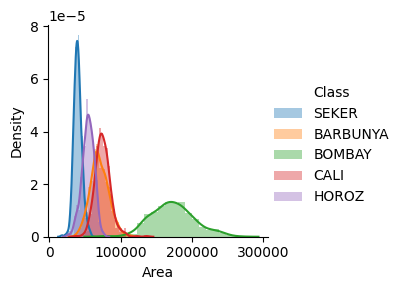

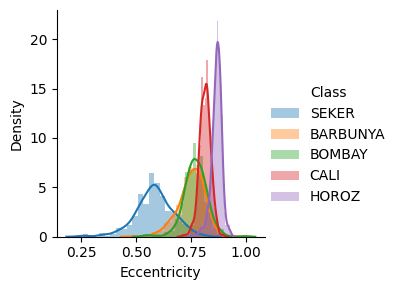

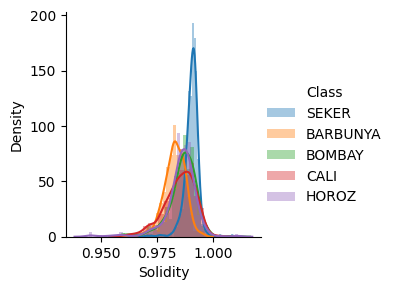

In [12]:
sns.FacetGrid(iris,hue="Class",height=3).map(sns.distplot,"Area").add_legend()
sns.FacetGrid(iris,hue="Class",height=3).map(sns.distplot,"Eccentricity").add_legend()
sns.FacetGrid(iris,hue="Class",height=3).map(sns.distplot,"Solidity").add_legend()
plt.show()

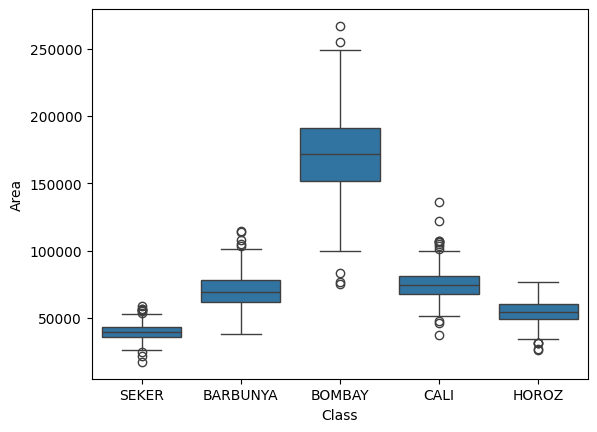

In [13]:
sns.boxplot(x="Class",y="Area",data=iris)
plt.show()

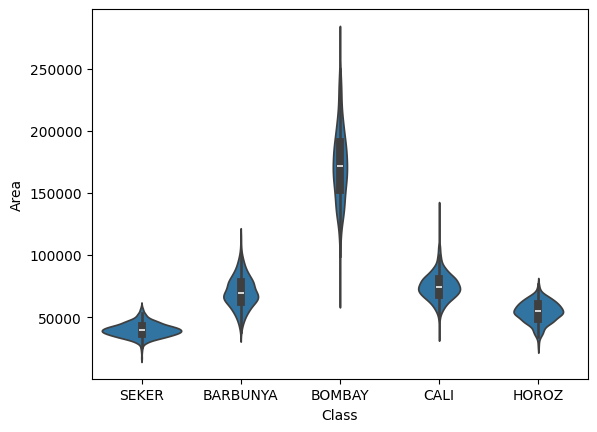

In [14]:
sns.violinplot(x="Class",y="Area",data=iris)
plt.show()

/usr/local/lib/python3.12/dist-packages/seaborn/axisgrid.py:2100: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


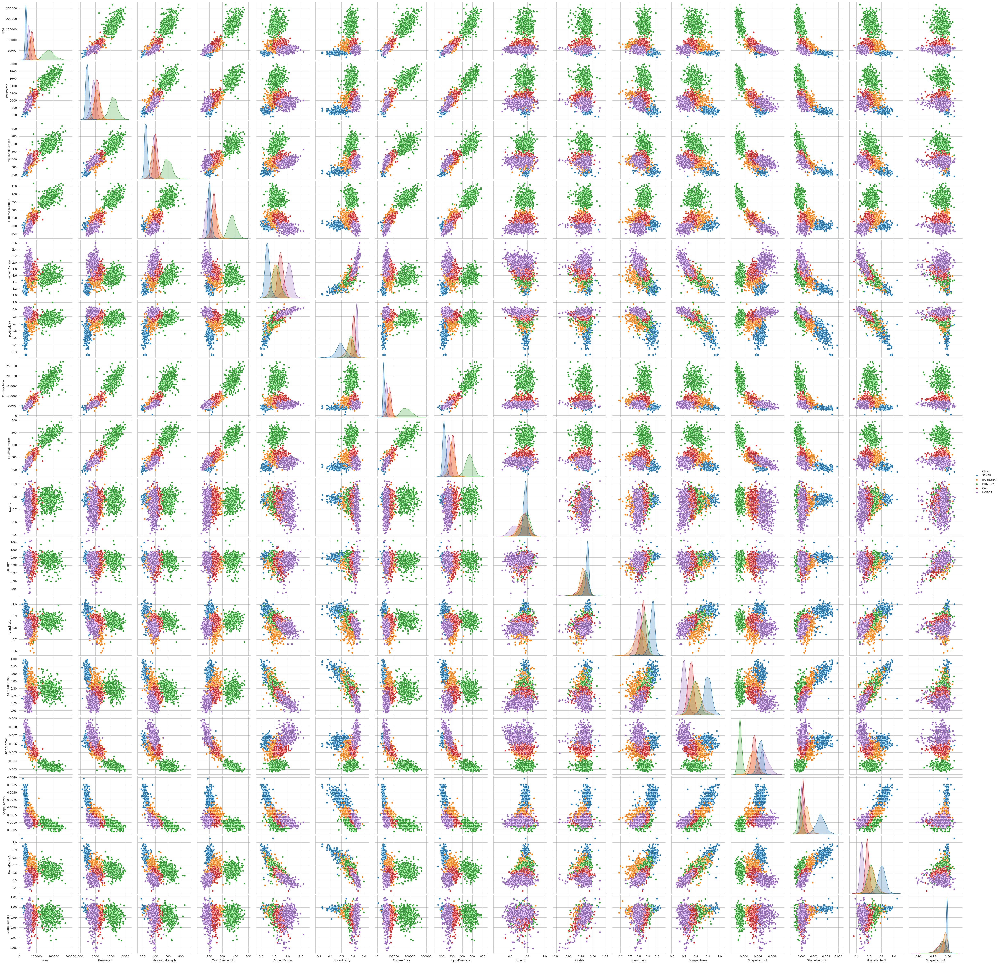

In [15]:
sns.set_style("whitegrid")
sns.pairplot(iris,hue="Class",size=3);
plt.show()